<a href="https://colab.research.google.com/github/daffarayhanriadi/Book-Recomendation/blob/main/mobilenet_701515_p2_aug.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Set Up**

In [308]:
!pip install split-folders

In [309]:
# Common imports
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import pathlib
import numpy as np
import tensorflow as tf
from typing import Tuple

# Data Imports
import pandas as pd
from tqdm import tqdm
from glob import glob
from zipfile import ZipFile
import splitfolders
from tensorflow import image as tfi

# Data Visualization
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Model Architecture
from tensorflow.keras import Sequential
from tensorflow.keras.applications import MobileNet, MobileNetV2, MobileNetV3Small
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense

# Model Training
from datetime import datetime
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Model Evaluation
from sklearn.metrics import classification_report, confusion_matrix

# CSV Callback
from tensorflow.keras.callbacks import CSVLogger

# Disable Warning
import warnings
warnings.filterwarnings("ignore")

# **Data Preparation**

In [310]:
# !kaggle datasets list -s "caisim"

In [311]:
# !kaggle datasets download -d "cendekialuthfietanz/caisim"

In [312]:
# # Extract the dataset file using unzip in git command or this code
# with ZipFile("caisim.zip", 'r') as data:
#     data.extractall(path="Android-Caisim/")

In [313]:
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [341]:
# Constants
IMAGE_SIZE = 224 # Size of the input image
BATCH_SIZE = 32 # Number of samples per gradient update
EPOCHS = 10 # Number of epochs to train the model
AUGMENT = True

# Hyperparameters
LEARNING_RATE = 1e-3 # Learning rate for the optimizer

# Model training
LOSS = 'sparse_categorical_crossentropy'
OPTIMIZER = Adam(learning_rate=LEARNING_RATE)
METRICS = ['accuracy']

# Random Seed
RANDOM_SEED = 1337 # Set random seed for reproducibility
tf.random.set_seed(RANDOM_SEED) # Set random seed for TensorFlow
np.random.seed(RANDOM_SEED) # Set random seed for NumPy

In [315]:
# Get the root path of the dataset
root_path = "/content/drive/MyDrive/Colab_Notebooks/Datasets/ori_dataset/"

# Get the split path of each dataset
root_split_path = "/content/split_data/"
split_data = "701515"
split_path = pathlib.Path(f"{root_split_path}/{split_data}")
split_path.mkdir(exist_ok=True, parents=True)

# Get the specific split path of the dataset section
train_path = f"{split_path}/train/"
valid_path = f"{split_path}/val/"
test_path = f"{split_path}/test/"

# Get saved model path
root_model_path = "/content/model/"
model_category = "mobilenet"
model_p = "p2"
model_aug = "aug"
model_path = pathlib.Path(f"{root_model_path}model_result/{split_data}/{model_category}/{model_p}/{model_aug}")
model_path.mkdir(exist_ok=True, parents=True)

In [316]:
# Split the dataset
splitfolders.ratio(root_path, output=split_path,seed=RANDOM_SEED, ratio=(.7, .15, .15))

Copying files: 1000 files [00:14, 66.72 files/s]


# **Functions**

In [317]:
def load_image(image_path: str) -> tf.Tensor:

    # Check if image path exists
    assert os.path.exists(image_path), f'Invalid image path: {image_path}'

    # Read the image file
    image = tf.io.read_file(image_path)

    # Load the image
    try:
        # Decode the image as JPEG
        image = tfi.decode_jpeg(image, channels=3)
    except:
        # If decoding as JPEG fails, try decoding as PNG
        image = tfi.decode_png(image, channels=3)

    # # Change the image data type
    image = tfi.convert_image_dtype(image, tf.float32)

    # # Resize the Image
    image = tfi.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

    return image

In [318]:
def load_dataset(root_path: str, class_names: list, trim: int=None) -> Tuple[np.ndarray, np.ndarray]:

    if trim:
        # Trim the size of the data
        n_samples = len(class_names) * trim
    else:
        # Collect total number of data samples
        n_samples = sum([len(os.listdir(os.path.join(root_path, name))) for name in class_names])

    # Create arrays to store images and labels
    images = np.empty(shape=(n_samples, IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.float32)
    labels = np.empty(shape=(n_samples, 1), dtype=np.int32)

    # Loop over all the image file paths, load and store the images with respective labels
    n_image = 0
    for class_name in tqdm(class_names, desc="Loading"):
        class_path = os.path.join(root_path, class_name)
        image_paths = list(glob(os.path.join(class_path, "*")))[:trim]
        for file_path in image_paths:
            # Load the image
            image = load_image(file_path)

            # Assign label
            label = class_names.index(class_name)

            # Store the image and the respective label
            images[n_image] = image
            labels[n_image] = label

            # Increment the number of images processed
            n_image += 1

    # Shuffle the data
    indices = np.random.permutation(n_samples)
    images = images[indices]
    labels = labels[indices]

    return images, labels

In [319]:
def plot_images(images: np.ndarray, labels: np.ndarray, n_rows: int=1, n_cols: int=3, class_names: list=None, model=None, save_path: str=None):

    # Randomly shuffle the images and labels
    indices = np.arange(len(images))
    np.random.shuffle(indices)
    images = images[indices]
    labels = labels[indices]

    # Create subplots
    _, axes = plt.subplots(n_rows, n_cols, figsize=(25, 16))

    # Iterate through the flattened axes
    for i, ax in enumerate(axes.flat):
        # Display the images
        ax.imshow(images[i])

        # Create title based on class names
        title = f"{class_names[labels[i]]}"

        # Add predictions if a model is provided
        if model:
            pred = model.predict(images[i][np.newaxis])
            pred_label = f"Prediction: {np.argmax(pred)}"
            pred_percentage = f" ({np.max(pred) * 100:.2f}%)"
            if class_names:
                pred_label += f" ({class_names[np.argmax(pred)]})"
            title += f"\n{pred_label}{pred_percentage}"

        # Set title and turn off axis
        ax.set_title(title, fontsize=14)
        ax.axis("off")

    if save_path:
        plt.savefig(save_path)

    # Show the plot
    plt.show()

In [320]:
def augment_images(images):
    # Randomly flip the images horizontally
    images = tf.image.random_flip_left_right(images)

    # Randomly flip the images vertically
    images = tf.image.random_flip_up_down(images)

    # Randomly rotate the images
    images = tf.image.rot90(images, k=tf.random.uniform([], 1, 4, dtype=tf.int32))

    # Randomly adjust the brightness of the images
    images = tf.image.random_brightness(images, max_delta=.2)

    # Randomly adjust the contrast of the images
    images = tf.image.random_contrast(images, lower=.8, upper=1.2)

    # Randomly adjust the hue of the images
    images = tf.image.random_hue(images, max_delta=.2)

    # Randomly adjust the saturation of the images
    images = tf.image.random_saturation(images, lower=.8, upper=1.2)

    # Randomly sure the pixel values are still in the range [0,1]
    images = tf.clip_by_value(images, .0, 1.0)

    return images

In [321]:
def create_dataset(X_data, y_data, buffer_size=1024, batch_size=BATCH_SIZE, augment=False):
    # Create a tf.data.Dataset for the data
    dataset = tf.data.Dataset.from_tensor_slices((X_data, y_data))

    if augment:
        # Shuffle and batch the data
        dataset = dataset.shuffle(buffer_size=buffer_size).batch(batch_size=batch_size)

        # Apply data augmentation to the images
        dataset = dataset.map(lambda x, y: (augment_images(x), y))

        # Repeat the dataset for multiple epochs
        dataset = dataset.repeat()
    else:
        # Batch the data without augmentation
        dataset = dataset.batch(batch_size=batch_size)

    # Prefetch the data for better performance
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

In [322]:
def timer(start_time: datetime = None) -> str:
    if not start_time:
        start_time = datetime.now()
        return start_time
    else:
        elapsed_time = datetime.now() - start_time
        hours, remainder = divmod(elapsed_time.total_seconds(), 3600)
        minutes, seconds = divmod(remainder, 60)
        return f"{int(hours)} hours {int(minutes)} minutes and {round(seconds, 2)} seconds."

In [323]:
def t_cm_plot(x_test=None, y_test=None, history=None, model=None, start_epoch: int=None, cm: np.ndarray=None, class_names: list=None, save_path: str=None):

    if cm is not None and cm.size > 0:
        plt.figure(figsize=(12, 10))
        sns.heatmap(cm, annot=True, vmin=0, fmt="g", cmap="Blues", cbar=False)
        plt.xticks(np.arange(len(class_names))+.5, class_names, rotation=90)
        plt.yticks(np.arange(len(class_names))+.5, class_names, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix", size=20)
    else:
        input_shape = model.layers[0].input_shape
        print(f"Input Shape Model: {input_shape}")

        test_loss, test_acc = model.evaluate(x_test, y_test)
        print("Loss     : {:.4}".format(test_loss))
        print("Accuracy : {:.4}%".format(test_acc*100))

        # Extract training and validation metrics from training data history
        t_loss = history.history['loss']
        t_acc = history.history['accuracy']
        v_loss = history.history['val_loss']
        v_acc = history.history['val_accuracy']

        # Calculate the total number of epochs including the starting epoch
        Epoch_count = len(t_acc) + start_epoch
        Epochs = []

        # Create a list of epoch numbers
        for i in range(start_epoch, Epoch_count):
            Epochs.append(i + 1)

        # Find the epoch with the lowest validation loss and the highest validation accuracy
        index_loss = np.argmin(v_loss)
        lowest_loss = v_loss[index_loss]
        index_acc = np.argmax(v_acc)
        highest_acc = v_acc[index_acc]

        # Set the plot style
        plt.style.use('fivethirtyeight')

        # Labels for scatter plot
        loss_sc_label = 'best epoch= ' + str(index_loss + 1 + start_epoch)
        acc_sc_label = 'best epoch= ' + str(index_acc + 1 + start_epoch)

        # Create a figure to display the model's performance
        plt.figure(figsize=(20, 8))

        # Plot the loss curve in the first subplot
        plt.subplot(1, 2, 1)
        # plt.subplots_adjust()
        plt.title("Loss Curve")
        plt.plot(Epochs, t_loss, label="Training Loss")
        plt.plot(Epochs, v_loss, label="Validation Loss")
        plt.axhline(y=test_loss, label="Test Loss", linestyle="--", color="green")
        plt.scatter(index_loss + 1 + start_epoch, lowest_loss, s=150, c='blue', label=loss_sc_label)
        plt.xlabel("Epochs")
        plt.ylabel("Cross Entropy Loss")
        plt.legend()
        plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

        # Plot the accuracy curve in the second subplot
        plt.subplot(1, 2, 2)
        plt.title("Accuracy Curve")
        plt.plot(Epochs, t_acc, label="Training Accuracy")
        plt.plot(Epochs, v_acc, label="Validation Accuracy")
        plt.axhline(y=test_acc, label="Test Accuracy", linestyle="--", color="green")
        plt.scatter(index_acc + 1 + start_epoch, highest_acc, s=150, c='blue', label=acc_sc_label)
        plt.xlabel("Epochs")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

        # Adjust layout
        plt.tight_layout()

    # Menyimpan figure
    plt.savefig(save_path)

    # Display the plot
    plt.show()

# **Data Loading**

In [324]:
# Collect the class names
class_names = sorted(os.listdir(train_path))
n_classes = len(class_names)

# Show
print(f"Total number of classes: {n_classes}")
print(f"Classes: {class_names}")

Total number of classes: 2
Classes: ['Ada Hama', 'Tidak Ada Hama']


In [325]:
# Load the training dataset
X_train, y_train = load_dataset(train_path, class_names)

# Load the validation dataset
X_valid, y_valid = load_dataset(valid_path, class_names)

# Load the testing dataset
X_test, y_test = load_dataset(test_path, class_names)

Loading: 100%|██████████| 2/2 [00:01<00:00,  1.11it/s]


# **Data Distribution**

In [326]:
# Calculate class distribution
train_class = [len(os.listdir(train_path + name)) for name in class_names]
val_class = [len(os.listdir(valid_path + name)) for name in class_names]
test_class = [len(os.listdir(test_path + name)) for name in class_names]

# Create DataFrame
data = pd.DataFrame({
    'Class Names': class_names * 3,
    'Count': train_class + val_class + test_class,
    'Dataset': ['Train'] * len(class_names) + ['Validation'] * len(class_names) + ['Test'] * len(class_names)
})
# Visualize using interactive pie chart
pie_chart = px.pie(data, values='Count', names='Class Names', color='Class Names', facet_col='Dataset')
pie_chart.update_layout({'title':{'text':"Class Distribution"}})
pie_chart.show()

# Visualize using interactive bar chart
bar_chart = px.bar(data, x='Class Names', y='Count', color='Class Names', facet_col='Dataset')
bar_chart.show()


# **Data Visualization**

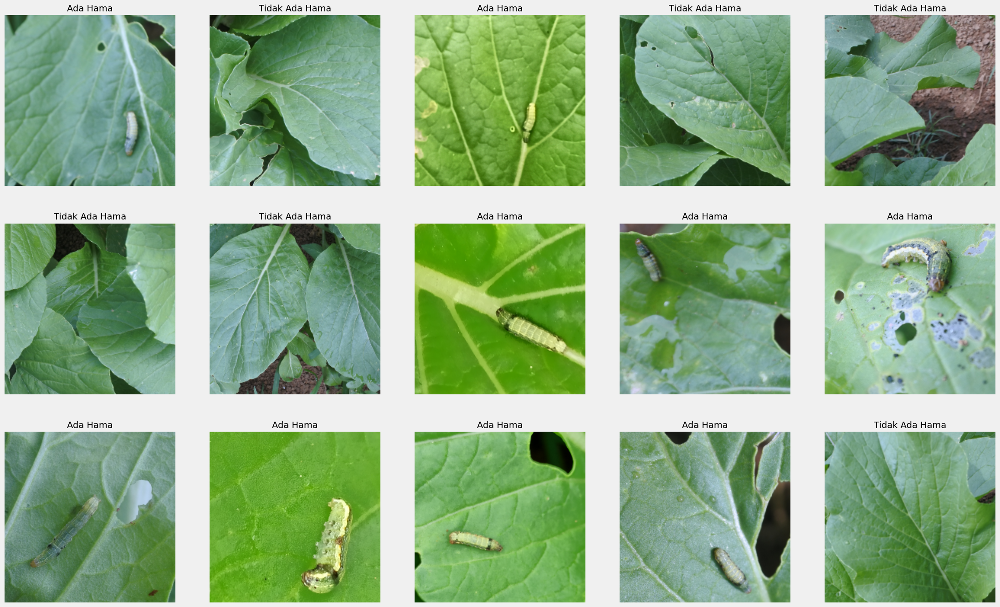

In [327]:
labels = y_train.flatten()

# Visualize training dataset
plot_images(X_train, labels, 3, n_cols=5, class_names=class_names)

# **Augment the Data**

In [328]:
# Create dataset with augmented images
train_dataset = create_dataset(X_train, y_train, augment=AUGMENT)
val_dataset = create_dataset(X_valid, y_valid)

# **Model Building and Summary**

In [329]:
# Download model
ff_model = MobileNet(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)
ff_model.trainable = False

hf_model = MobileNet(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)
hf_model.trainable = True

nf_model = MobileNet(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), weights='imagenet', include_top=False)
nf_model.trainable = True

17225924/17225924 [==============================] - 0s 0us/step


In [330]:
# Freeze the first half of the layers (up to a certain index)
for layer in hf_model.layers[:len(hf_model.layers)//2]:
    layer.trainable = False

In [331]:
# Define the full freeze model architecture
ff_name = f"pest_detection_ff_{model_category}_{model_p}_{model_aug}"
ff_architectur = Sequential([
    ff_model,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(n_classes, activation="softmax")
], name=ff_name)

# Compile model with specified loss, optimizers, and metrics
ff_architectur.compile(
    loss=LOSS,
    optimizer=OPTIMIZER,
    metrics=METRICS
)

# Display the model summary
ff_architectur.summary()

Model: "pest_detection_ff_mobilenet_p2_aug"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_3  (None, 1024)              0         
 0 (GlobalAveragePooling2D)                                      
                                                                 
 dropout_30 (Dropout)        (None, 1024)              0         
                                                                 
 dense_30 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 3230914 (12.32 MB)
Trainable params: 2050 (8.01 KB)
Non-trainable params: 3228864 (12.32 MB)
_________________________________________________________

In [339]:
# Define the half freeze model architecture
hf_name = f"pest_detection_hf_{model_category}_{model_p}_{model_aug}"
hf_architectur = Sequential([
    hf_model,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(n_classes, activation="softmax")
], name=hf_name)

# Compile model with specified loss, optimizers, and metrics
hf_architectur.compile(
    loss=LOSS,
    optimizer=OPTIMIZER,
    metrics=METRICS
)

# Display the model summary
hf_architectur.summary()

Model: "pest_detection_hf_mobilenet_p2_aug"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_3  (None, 1024)              0         
 3 (GlobalAveragePooling2D)                                      
                                                                 
 dropout_33 (Dropout)        (None, 1024)              0         
                                                                 
 dense_33 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 3230914 (12.32 MB)
Trainable params: 2939906 (11.21 MB)
Non-trainable params: 291008 (1.11 MB)
_______________________________________________________

In [342]:
# Define the no freeze model architecture
nf_name = f"pest_detection_nf_{model_category}_{model_p}_{model_aug}"
nf_architectur = Sequential([
    nf_model,
    GlobalAveragePooling2D(),
    Dropout(0.5),
    Dense(n_classes, activation="softmax")
], name=nf_name)

# Compile model with specified loss, optimizers, and metrics
nf_architectur.compile(
    loss=LOSS,
    optimizer=OPTIMIZER,
    metrics=METRICS
)

# Display the model summary
nf_architectur.summary()

Model: "pest_detection_nf_mobilenet_p2_aug"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 global_average_pooling2d_3  (None, 1024)              0         
 4 (GlobalAveragePooling2D)                                      
                                                                 
 dropout_34 (Dropout)        (None, 1024)              0         
                                                                 
 dense_34 (Dense)            (None, 2)                 2050      
                                                                 
Total params: 3230914 (12.32 MB)
Trainable params: 3209026 (12.24 MB)
Non-trainable params: 21888 (85.50 KB)
_______________________________________________________

# **Model Training**

In [334]:
if AUGMENT:
    # Define the number of steps per epoch
    STEPS_PER_EPOCH = len(X_train) // BATCH_SIZE
else:
    STEPS_PER_EPOCH = None

In [335]:
# Delete the training and validation datasets to clean up memory
del X_train
del y_train
del X_valid
del y_valid

In [336]:
# Print information about the training process
print(f"\nTraining {ff_architectur.name}: ")
CSV_FILE = f"{model_path}/{ff_architectur.name}.csv"

start_timer = timer()
# Train the model using the fit method
ff_history = ff_architectur.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=[
        EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint(f"{model_path}/checkpoint_{ff_architectur.name}.h5", save_best_only=True),
        CSVLogger(CSV_FILE)
    ],
    steps_per_epoch=STEPS_PER_EPOCH,
    batch_size=BATCH_SIZE
)
end_timer = timer(start_timer)
print(end_timer)


Training pest_detection_ff_mobilenet_p2_aug: 
Epoch 1/10
21/21 [==============================] - ETA: 0s - loss: 0.5447 - accuracy: 0.7411

21/21 [==============================] - 9s 228ms/step - loss: 0.5447 - accuracy: 0.7411 - val_loss: 0.0929 - val_accuracy: 0.9800
Epoch 2/10
21/21 [==============================] - 5s 186ms/step - loss: 0.1718 - accuracy: 0.9386 - val_loss: 0.0417 - val_accuracy: 0.9933
Epoch 3/10
21/21 [==============================] - 4s 191ms/step - loss: 0.0923 - accuracy: 0.9626 - val_loss: 0.0305 - val_accuracy: 1.0000
Epoch 4/10
21/21 [==============================] - 3s 160ms/step - loss: 0.0975 - accuracy: 0.9656 - val_loss: 0.0256 - val_accuracy: 1.0000
Epoch 5/10
21/21 [==============================] - 3s 155ms/step - loss: 0.0710 - accuracy: 0.9760 - val_loss: 0.0255 - val_accuracy: 1.0000
Epoch 6/10
21/21 [==============================] - 3s 166ms/step - loss: 0.0710 - accuracy: 0.9701 - val_loss: 0.0205 - val_accuracy: 0.9933
Epoch 7/10
21/21 [==============================] - 4s 197ms/step - loss: 0.0691 - accuracy: 0.9701 - val_loss: 0.0184 - val_accuracy: 1.0000
Epoch 8/10
21/21 

In [340]:
# Print information about the training process
print(f"\nTraining {hf_architectur.name}: ")
CSV_FILE = f"{model_path}/{hf_architectur.name}.csv"

start_timer = timer()
# Train the model using the fit method
hf_history = hf_architectur.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=[
        EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint(f"{model_path}/checkpoint_{hf_architectur.name}.h5", save_best_only=True),
        CSVLogger(CSV_FILE)
    ],
    steps_per_epoch=STEPS_PER_EPOCH,
    batch_size=BATCH_SIZE
)
end_timer = timer(start_timer)
print(end_timer)


Training pest_detection_hf_mobilenet_p2_aug: 
Epoch 1/10
21/21 [==============================] - 14s 233ms/step - loss: 0.2062 - accuracy: 0.9435 - val_loss: 1.3351 - val_accuracy: 0.8267
Epoch 2/10
21/21 [==============================] - 4s 168ms/step - loss: 0.0937 - accuracy: 0.9760 - val_loss: 0.0338 - val_accuracy: 0.9933
Epoch 3/10
21/21 [==============================] - 4s 184ms/step - loss: 0.0389 - accuracy: 0.9895 - val_loss: 1.3979 - val_accuracy: 0.8733
Epoch 4/10
21/21 [==============================] - 4s 181ms/step - loss: 0.0051 - accuracy: 0.9985 - val_loss: 1.4788 - val_accuracy: 0.8533
Epoch 5/10
21/21 [==============================] - 3s 157ms/step - loss: 0.0336 - accuracy: 0.9865 - val_loss: 0.0478 - val_accuracy: 0.9800
0 hours 0 minutes and 28.37 seconds.


In [343]:
# Print information about the training process
print(f"\nTraining {nf_architectur.name}: ")
CSV_FILE = f"{model_path}/{nf_architectur.name}.csv"

start_timer = timer()
# Train the model using the fit method
nf_history = nf_architectur.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=[
        EarlyStopping(patience=3, restore_best_weights=True),
        ModelCheckpoint(f"{model_path}/checkpoint_{nf_architectur.name}.h5", save_best_only=True),
        CSVLogger(CSV_FILE)
    ],
    steps_per_epoch=STEPS_PER_EPOCH,
    batch_size=BATCH_SIZE
)
end_timer = timer(start_timer)
print(end_timer)


Training pest_detection_nf_mobilenet_p2_aug: 
Epoch 1/10
21/21 [==============================] - 21s 248ms/step - loss: 0.1941 - accuracy: 0.9524 - val_loss: 5.5120 - val_accuracy: 0.5933
Epoch 2/10
21/21 [==============================] - 5s 227ms/step - loss: 0.0518 - accuracy: 0.9835 - val_loss: 0.2468 - val_accuracy: 0.9467
Epoch 3/10
21/21 [==============================] - 3s 151ms/step - loss: 0.1025 - accuracy: 0.9760 - val_loss: 10.0466 - val_accuracy: 0.5267
Epoch 4/10
21/21 [==============================] - 4s 173ms/step - loss: 0.0711 - accuracy: 0.9775 - val_loss: 13.0439 - val_accuracy: 0.5200
Epoch 5/10
21/21 [==============================] - 5s 230ms/step - loss: 0.1412 - accuracy: 0.9701 - val_loss: 0.5426 - val_accuracy: 0.9600
0 hours 0 minutes and 37.91 seconds.



pest_detection_ff_mobilenet_p2_aug
Input Shape Model: (None, 224, 224, 3)
5/5 [==============================] - 0s 37ms/step - loss: 0.0136 - accuracy: 1.0000
Loss     : 0.01361
Accuracy : 100.0%


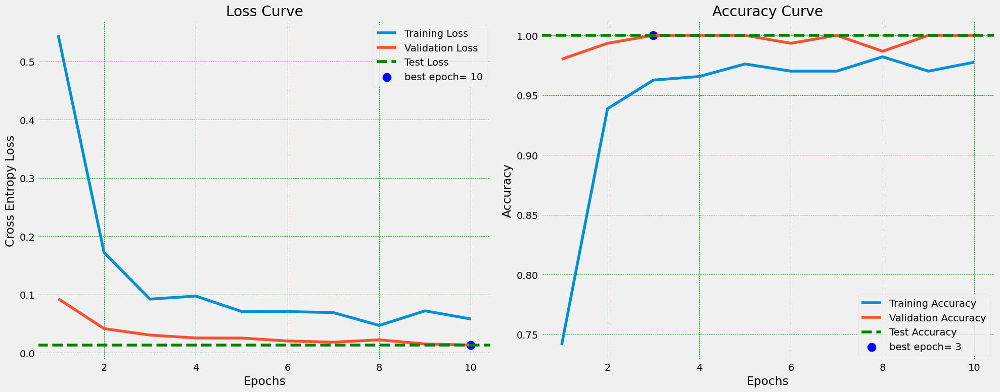






pest_detection_hf_mobilenet_p2_aug
Input Shape Model: (None, 224, 224, 3)
5/5 [==============================] - 0s 36ms/step - loss: 0.0458 - accuracy: 0.9933
Loss     : 0.04584
Accuracy : 99.33%


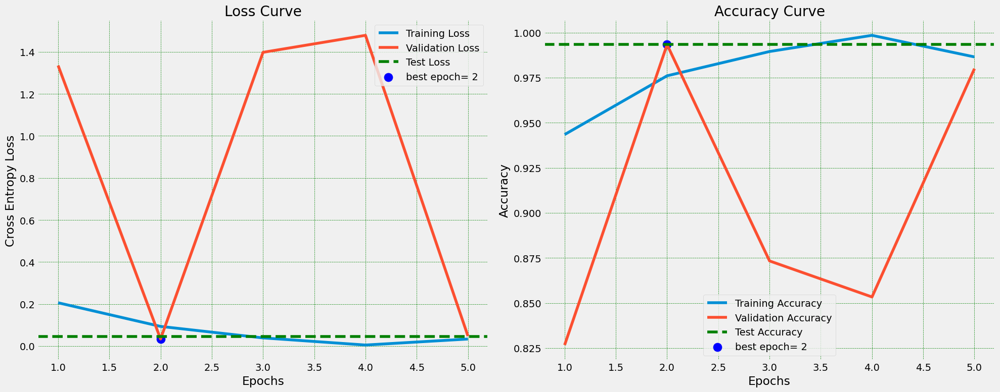






pest_detection_nf_mobilenet_p2_aug
Input Shape Model: (None, 224, 224, 3)
5/5 [==============================] - 0s 46ms/step - loss: 0.1888 - accuracy: 0.9600
Loss     : 0.1888
Accuracy : 96.0%


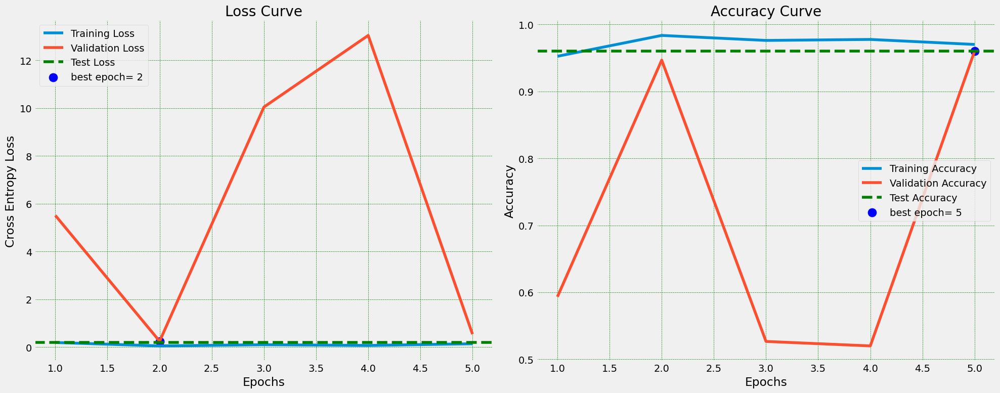

In [344]:
save_model_img = pathlib.Path(f"{root_model_path}img/{model_category}/{split_data}/{model_p}/{model_aug}")
save_model_img.mkdir(exist_ok=True, parents=True)

# Training Plot Full Freeze model
print(f"\n{ff_architectur.name}")
t_cm_plot(X_test, y_test, ff_history, ff_architectur, 0, save_path=f"{save_model_img}/ff_training_plot")
print("\n\n\n")

# Training Plot Half Freeze model
print(f"\n{hf_architectur.name}")
t_cm_plot(X_test, y_test, hf_history, hf_architectur, 0, save_path=f"{save_model_img}/hf_training_plot")
print("\n\n\n")

# Training Plot No Freeze model
print(f"\n{nf_architectur.name}")
t_cm_plot(X_test, y_test, nf_history, nf_architectur, 0, save_path=f"{save_model_img}/nf_training_plot")

# **Performance Measures**

In [345]:
# Full Freeze CR
print(f"\n{ff_architectur.name}")
ff_y_pred = np.argmax(ff_architectur.predict(X_test, verbose=0), axis=-1)
print(classification_report(y_test, ff_y_pred, zero_division=0))
print("\n\n\n")

# Half Freeze CR
print(f"\n{hf_architectur.name}")
hf_y_pred = np.argmax(hf_architectur.predict(X_test, verbose=0), axis=-1)
print(classification_report(y_test, hf_y_pred, zero_division=0))
print("\n\n\n")

# No Freeze CR
print(f"\n{nf_architectur.name}")
nf_y_pred = np.argmax(nf_architectur.predict(X_test, verbose=0), axis=-1)
print(classification_report(y_test, nf_y_pred, zero_division=0))


pest_detection_ff_mobilenet_p2_aug
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150






pest_detection_hf_mobilenet_p2_aug
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        75
           1       1.00      0.99      0.99        75

    accuracy                           0.99       150
   macro avg       0.99      0.99      0.99       150
weighted avg       0.99      0.99      0.99       150






pest_detection_nf_mobilenet_p2_aug
              precision    recall  f1-score   support

           0       0.94      0.99      0.96        75
           1       0.99      0.93      0.96        75

    accuracy                           0.96       150
   macro avg


pest_detection_ff_mobilenet_p2_aug


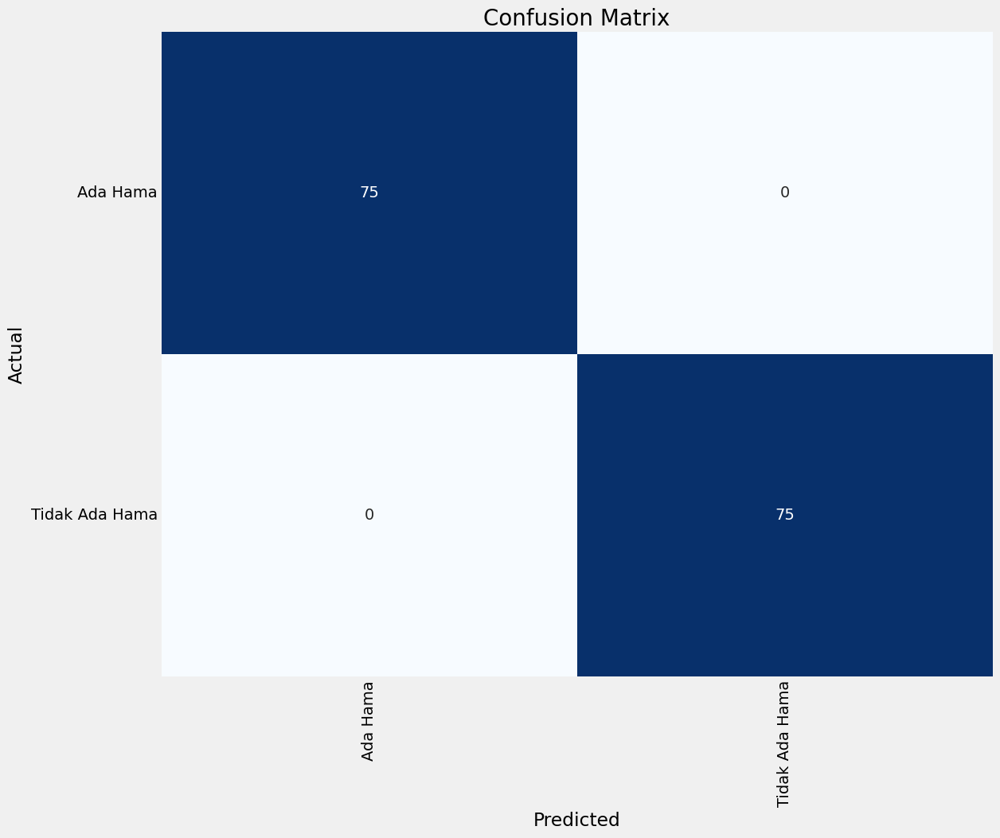






pest_detection_hf_mobilenet_p2_aug


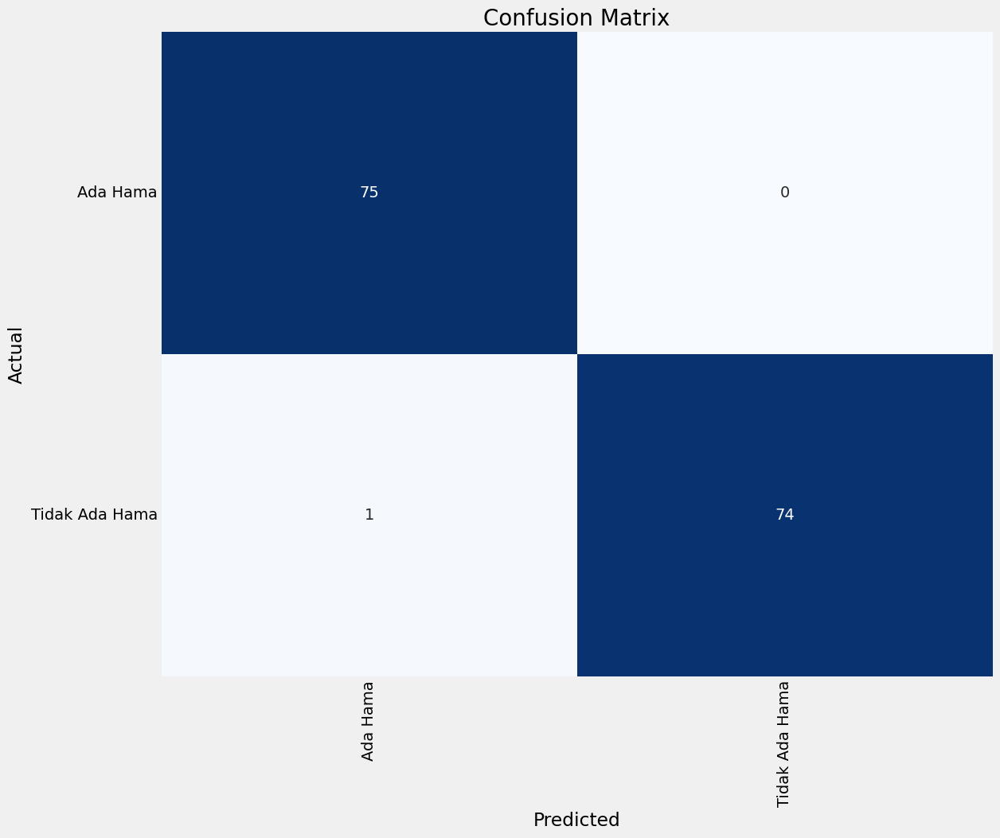






pest_detection_nf_mobilenet_p2_aug


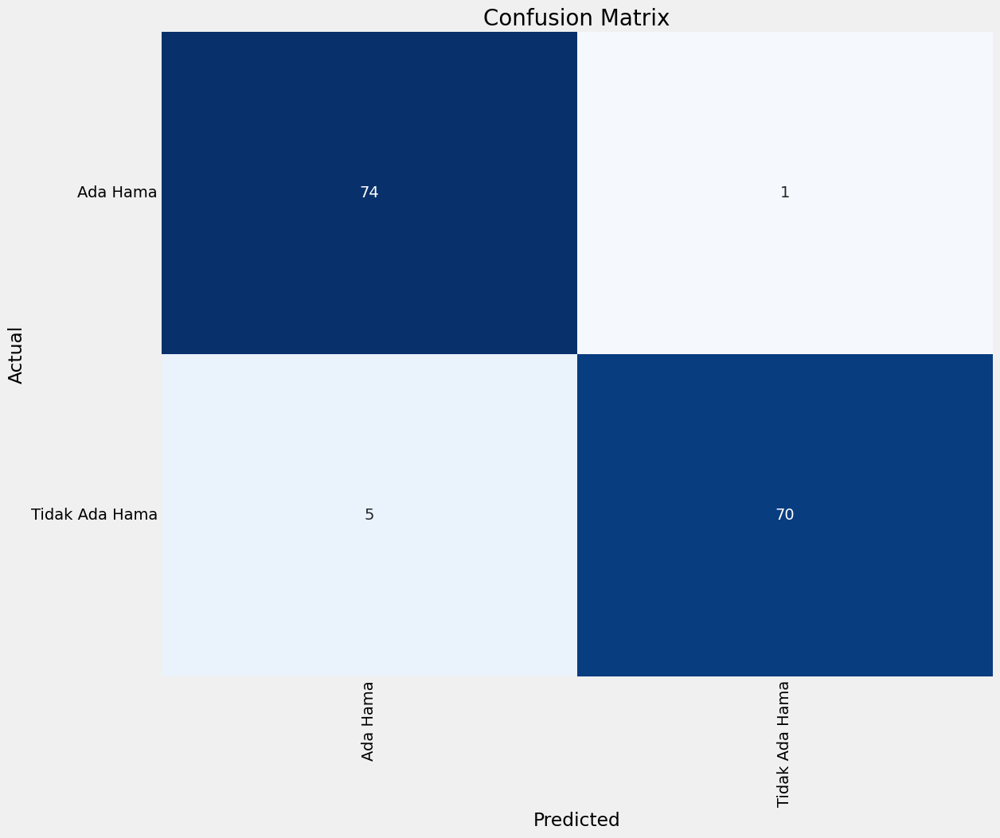

In [346]:
# Full Freeze CM
print(f"\n{ff_architectur.name}")
cm = confusion_matrix(y_test, ff_y_pred)
t_cm_plot(cm=cm, class_names=class_names, save_path=f"{save_model_img}/ff_confusion_matrix")
print("\n\n\n")

# Half Freeze CM
print(f"\n{hf_architectur.name}")
cm = confusion_matrix(y_test, hf_y_pred)
t_cm_plot(cm=cm, class_names=class_names, save_path=f"{save_model_img}/hf_confusion_matrix")
print("\n\n\n")

# No Freeze CM
print(f"\n{nf_architectur.name}")
cm = confusion_matrix(y_test, nf_y_pred)
t_cm_plot(cm=cm, class_names=class_names, save_path=f"{save_model_img}/nf_confusion_matrix")

# **Model Predictions Visualization**

1/1 [==============================] - 0s 38ms/step


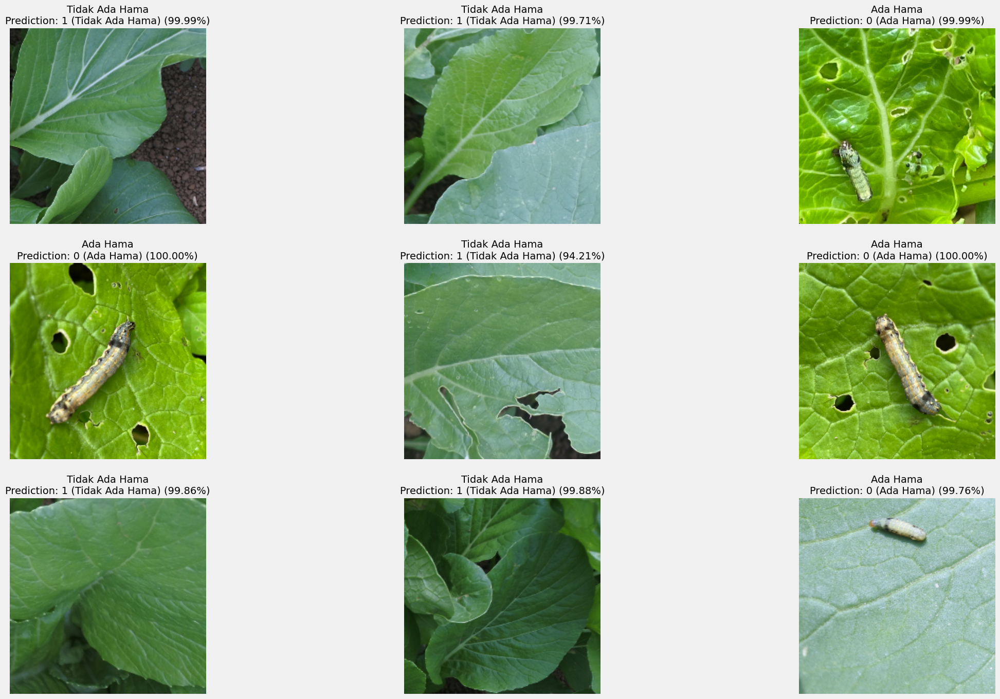

In [347]:
labels = y_test.flatten()
# Full Freeze Prediction
plot_images(images=X_test, labels=labels, class_names=class_names,model=ff_architectur, n_rows=3, save_path=f"{save_model_img}/ff_model_prediction.jpg")

1/1 [==============================] - 0s 22ms/step


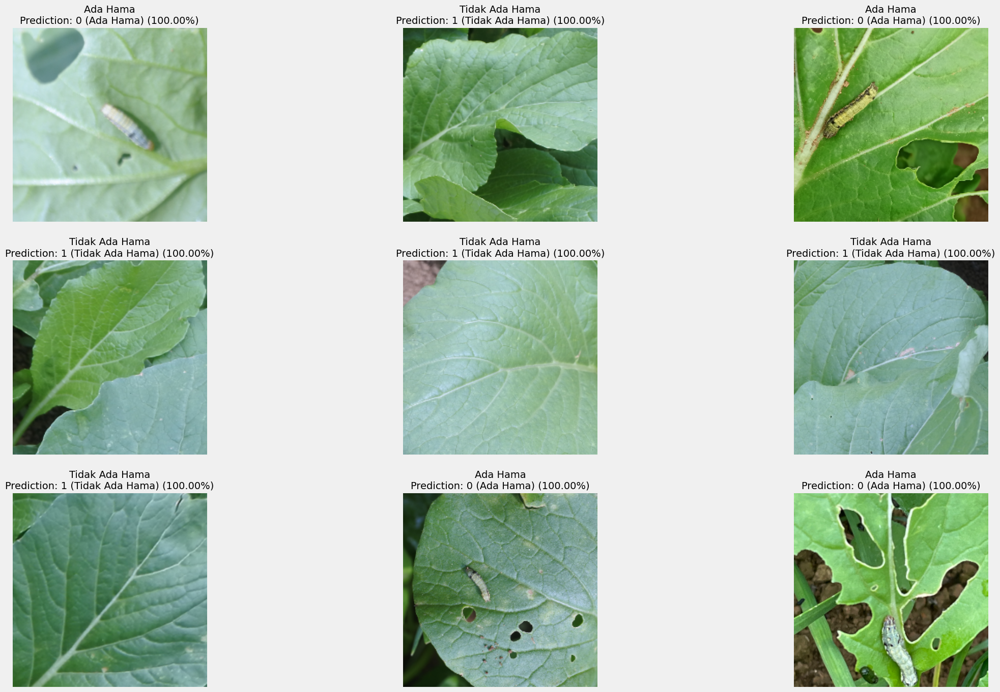

In [348]:
# Half Freeze Prediction
plot_images(images=X_test, labels=labels, class_names=class_names, model=hf_architectur, n_rows=3, save_path=f"{save_model_img}/hf_model_prediction.jpg")

1/1 [==============================] - 0s 24ms/step


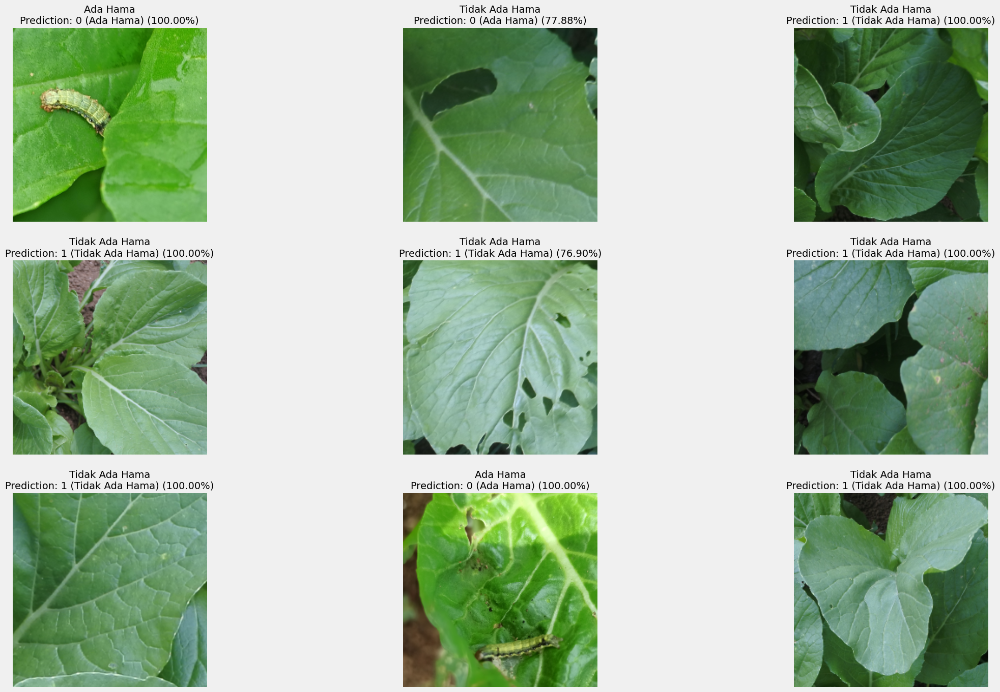

In [349]:
# No Freeze Prediction
plot_images(images=X_test, labels=labels, class_names=class_names, model=nf_architectur, n_rows=3, save_path=f"{save_model_img}/nf_model_prediction.jpg")

# **CSV Preview**

In [350]:
# Read Full Freeze Model CSV Training
pd.read_csv(f"{model_path}/{ff_architectur.name}.csv").head()

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.741071,0.544717,0.980000,0.092911
1,1,0.938623,0.171802,0.993333,0.041652
2,2,0.962575,0.092287,1.000000,0.030541
3,3,0.965569,0.097531,1.000000,0.025623
4,4,0.976048,0.070983,1.000000,0.025476


In [351]:
# Read Half Freeze Model CSV Training
pd.read_csv(f"{model_path}/{hf_architectur.name}.csv").head()

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.943452,0.206167,0.826667,1.335053
1,1,0.976048,0.093656,0.993333,0.033765
2,2,0.989521,0.038943,0.873333,1.397882
3,3,0.998503,0.005061,0.853333,1.478788
4,4,0.986527,0.033598,0.980000,0.047778


In [352]:
# Read No Freeze Model CSV Training
pd.read_csv(f"{model_path}/{nf_architectur.name}.csv").head()

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.952381,0.194075,0.593333,5.512034
1,1,0.983533,0.051820,0.946667,0.246848
2,2,0.976048,0.102479,0.526667,10.046593
3,3,0.977545,0.071060,0.520000,13.043876
4,4,0.970060,0.141228,0.960000,0.542562


# **Export/Save the model with SavedModel from Keras**

In [353]:
# Save Full Freeze Model
ff_architectur.save(f"{model_path}/{ff_architectur.name}.h5")

# Save Half Freeze Model
hf_architectur.save(f"{model_path}/{hf_architectur.name}.h5")

# Save No Freeze Model
nf_architectur.save(f"{model_path}/{nf_architectur.name}.h5")

# **Evaluate Model**

In [354]:
# Load Full Freeze Model
load_ff_model = tf.keras.models.load_model(f"{model_path}/{ff_architectur.name}.h5")

# Load Half Freeze Model
load_hf_model = tf.keras.models.load_model(f"{model_path}/{hf_architectur.name}.h5")

# Load No Freeze Model
load_nf_model = tf.keras.models.load_model(f"{model_path}/{nf_architectur.name}.h5")

In [355]:
print(f"\n{ff_architectur.name}")
test_loss, test_acc = load_ff_model.evaluate(X_test, y_test)
print("Loss     : {:.4}".format(test_loss))
print("Accuracy : {:.4}".format(test_acc*100))

print(f"\n{hf_architectur.name}")
test_loss, test_acc = load_hf_model.evaluate(X_test, y_test)
print("Loss     : {:.4}".format(test_loss))
print("Accuracy : {:.4}".format(test_acc*100))

print(f"\n{nf_architectur.name}")
test_loss, test_acc = load_nf_model.evaluate(X_test, y_test)
print("Loss     : {:.4}".format(test_loss))
print("Accuracy : {:.4}".format(test_acc*100))


pest_detection_ff_mobilenet_p2_aug
5/5 [==============================] - 1s 48ms/step - loss: 0.0136 - accuracy: 1.0000
Loss     : 0.01361
Accuracy : 100.0

pest_detection_hf_mobilenet_p2_aug
5/5 [==============================] - 1s 39ms/step - loss: 0.0458 - accuracy: 0.9933
Loss     : 0.04584
Accuracy : 99.33

pest_detection_nf_mobilenet_p2_aug
5/5 [==============================] - 1s 35ms/step - loss: 0.1888 - accuracy: 0.9600
Loss     : 0.1888
Accuracy : 96.0


In [356]:
!zip -r mobilenet_701515_p2_aug.zip /content/model
!cp mobilenet_701515_p2_aug.zip /content/drive/MyDrive/Colab_Notebooks/Thesis_Model/

  adding: content/model/ (stored 0%)
  adding: content/model/img/ (stored 0%)
  adding: content/model/img/mobilenet/ (stored 0%)
  adding: content/model/img/mobilenet/701515/ (stored 0%)
  adding: content/model/img/mobilenet/701515/p2/ (stored 0%)
  adding: content/model/img/mobilenet/701515/p2/aug/ (stored 0%)
  adding: content/model/img/mobilenet/701515/p2/aug/ff_model_prediction.jpg (deflated 14%)
  adding: content/model/img/mobilenet/701515/p2/aug/ff_training_plot.png (deflated 15%)
  adding: content/model/img/mobilenet/701515/p2/aug/hf_training_plot.png (deflated 10%)
  adding: content/model/img/mobilenet/701515/p2/aug/ff_confusion_matrix.png (deflated 37%)
  adding: content/model/img/mobilenet/701515/p2/aug/nf_confusion_matrix.png (deflated 37%)
  adding: content/model/img/mobilenet/701515/p2/aug/nf_model_prediction.jpg (deflated 16%)
  adding: content/model/img/mobilenet/701515/p2/aug/hf_model_prediction.jpg (deflated 17%)
  adding: content/model/img/mobilenet/701515/p2/aug/hf_c